In [1]:
from PIL import Image
import numpy as np


IMAGE_ORIGINALE = "image_originale.png" 
IMAGE_ENCODEE = "image_encodee_R_simple.png"
MESSAGE_SECRET = "Mon message secret pour le TP LSB en Rouge!"

In [ ]:
# utilitaire 

def text_to_binary(text):
    """Convertit texte en binaire (ex: 'A' -> '01000001')."""
    binary_string = ""
    for char in text:
        binary_string += format(ord(char), '08b')
    return binary_string

def binary_to_text(binary):
    """Convertit binaire en texte."""
    text_string = ""
    
    for i in range(0, len(binary), 8):
        byte = binary[i:i+8]
        text_string += chr(int(byte, 2))
    return text_string


In [ ]:

# ENCODAGE

def encode_message_simple(image_path, message, output_path):
    """Cache le message dans le LSB du canal R (1 bit/pixel)."""
    
    img = Image.open(image_path).convert("RGB")
    
    # Ajout du terminateur '00000000'
    binary_message = text_to_binary(message + '\x00')
    msg_len = len(binary_message)
    bit_index = 0
    
    for y in range(img.height):
        for x in range(img.width):
            if bit_index >= msg_len:
                img.save(output_path, "PNG")
                return 
            
            r, g, b = img.getpixel((x, y))
            bit_to_encode = int(binary_message[bit_index])
            
            # Modification LSB : (r & ~1) met LSB à 0. | bit_to_encode ajoute le nouveau bit.
            r = (r & ~1) | bit_to_encode
            
            bit_index += 1
            
            img.putpixel((x, y), (r, g, b))
            
    img.save(output_path, "PNG")


In [ ]:

# --- DECODAGE (Canal R) ---

def decode_message_simple(image_path):
    """Extrait le message depuis le LSB du canal R."""
    
    img = Image.open(image_path).convert("RGB")
    binary_message = ""
    terminator = '00000000'
    
    for y in range(img.height):
        for x in range(img.width):
            r, g, b = img.getpixel((x, y))#prend numéro du pixel x,y et trouve les valeur r g b
            
            # Extraire le LSB du canal R
            binary_message += str(r & 1) #masque 00000001 et r donc determine le LSB
            
            # Vérifier si le terminateur est trouvé
            if len(binary_message) >= 8 and binary_message[-8:] == terminator:
                return binary_to_text(binary_message[:-8])
                
    return "pas de terminateur"

In [4]:



# 1. ENCODAGE
print(f"1. Encodage en cours de: '{MESSAGE_SECRET}'")
encode_message_simple(IMAGE_ORIGINALE, MESSAGE_SECRET, IMAGE_ENCODEE)
print(f"   Image encodée générée: {IMAGE_ENCODEE}")

# 2. DECODAGE
message_trouve = decode_message_simple(IMAGE_ENCODEE)
print("\n2. Décodage terminé.")
print(f"   Message extrait: '{message_trouve}'")

1. Encodage en cours de: 'Mon message secret pour le TP LSB en Rouge!'
   Image encodée générée: image_encodee_R_simple.png

2. Décodage terminé.
   Message extrait: 'Mon message secret pour le TP LSB en Rouge!'


--- RÉSULTATS D'ANALYSE ---
Nombre de bits modifiés (LSBs R) : 193
Mean Squared Error (MSE) : 0.0000
Commentaire: La modification est invisible (MSE < 1.0).


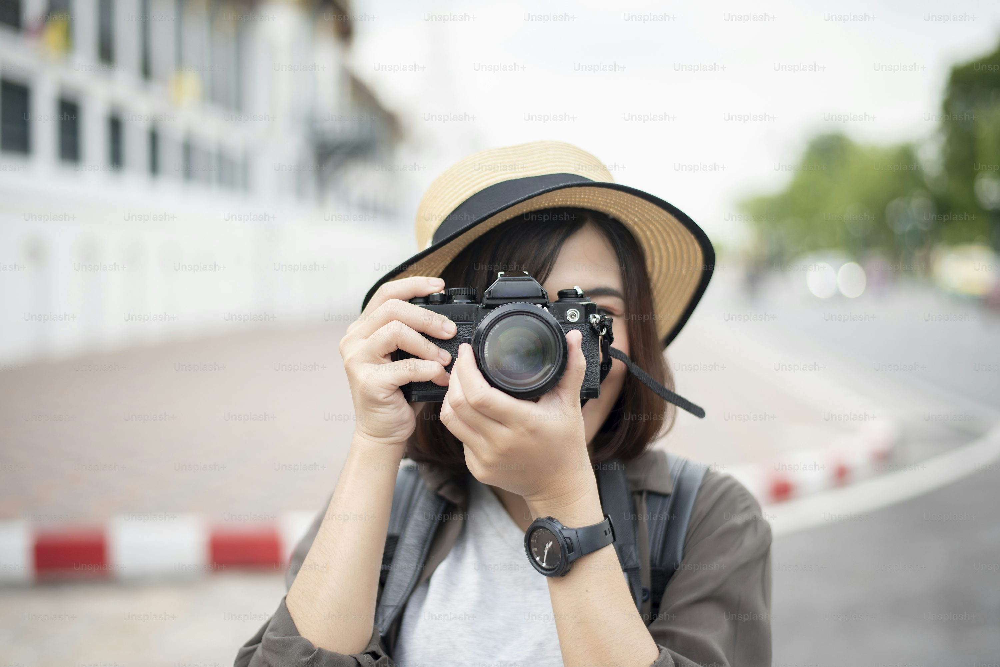

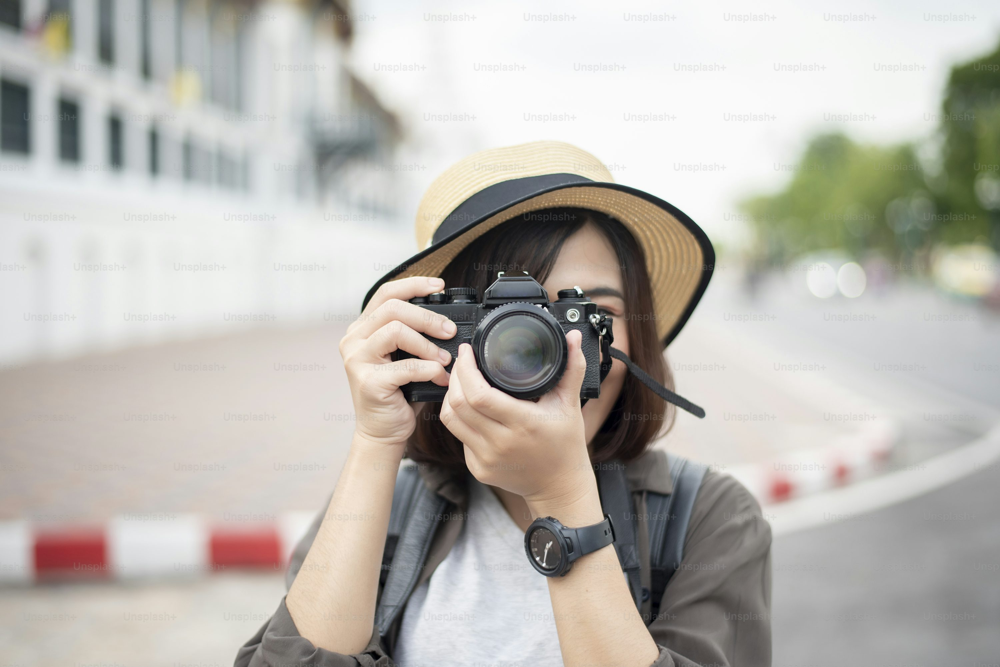

In [ ]:
# --- FONCTION D'ANALYSE ---

def analyze_simple(original_path, encoded_path):
    """Calcule le MSE et le nombre de bits modifiés (canal R uniquement)."""
    
    img_orig = Image.open(original_path).convert("RGB")
    img_enc = Image.open(encoded_path).convert("RGB")

    arr_orig = np.array(img_orig, dtype=np.uint8)#transformation en tableau numpy
    arr_enc = np.array(img_enc, dtype=np.uint8)
    
    # Isoler les canaux Rouges (index 0)
    r_orig = arr_orig[:, :, 0]
    r_enc = arr_enc[:, :, 0]

    # Calcul du nombre de bits modifiés (comparaison des LSBs de R)
    lsb_orig = r_orig & 1
    lsb_enc = r_enc & 1
    nb_bits_modifies = (lsb_orig != lsb_enc).sum()

    # Calcul de la MSE globale (sur R, G, B)
    mse = np.mean((arr_orig.astype(np.float64) - arr_enc.astype(np.float64)) ** 2)

    return nb_bits_modifies, mse

# --- AFFICHAGE ET EXÉCUTION ---

nb_bits, mse_value = analyze_simple(IMAGE_ORIGINALE, IMAGE_ENCODEE)

print("--- RÉSULTATS D'ANALYSE ---")
print(f"Nombre de bits modifiés : {nb_bits}")
print(f"Mean Squared Error: {mse_value:.4f}")

# Affichage des images pour la comparaison visuelle
display(Image.open(IMAGE_ORIGINALE), Image.open(IMAGE_ENCODEE))
print("")

Bilan de notre TP de Stéganographie LSB

Ce projet de stéganographie nous a permis de tester la technique de steganographie du LSB (Least Significant Bit) pour cacher un message texte dans une image PNG en utilisant uniquement le canal Rouge. Le principe est simple : modifier le dernier bit de la valeur de couleur de chaque pixel sans que l'œil humain ne s'en aperçoive. On a choisis le rouge pour simplifier la matrice d'origine.

La complexité majeur de Python réside dans la manipulation directe des bits:

    L'opérateur ET binaire est crucial pour l'extraction du bit caché et pour l'étape de masquage.

    L'opérateur NON binaire est utilisé pour créer le masque, notamment dans l'expression complexe mais essentielle r = (r & ~1) | bit_to_encode. Cette formule permet de forcer le LSB à zéro avant d'y insérer le nouveau bit.

    L'opérateur OU binaire sert à l'insertion finale du bit de message.

Pour un débutant en Python, ces opérateurs logiques peuvent paraître inhabituels, car ils sont rarement utilisés dans la programmation quotidienne.

En réussissant à encoder et décoder le message grâce à ces opérations binaires, et en utilisant un terminateur ('00000000') pour marquer la fin du message, nous avons démontré que la stéganographie LSB est simple et efficace pour l'occultation.

Il faut absolument utiliser du png sinon ca ne marche pas.